In [2]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import scipy
from scipy import stats
from numpy.random import randn  
# 標準正規乱数はよく使うので，randn として importしておく

In [3]:
from PIL import Image
# pillowをインポートして画像を表示

# 19

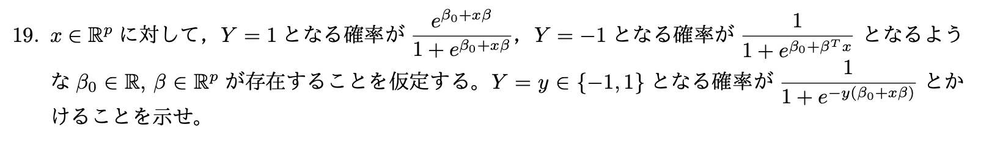

In [4]:
im = Image.open("question/q19.png")
im

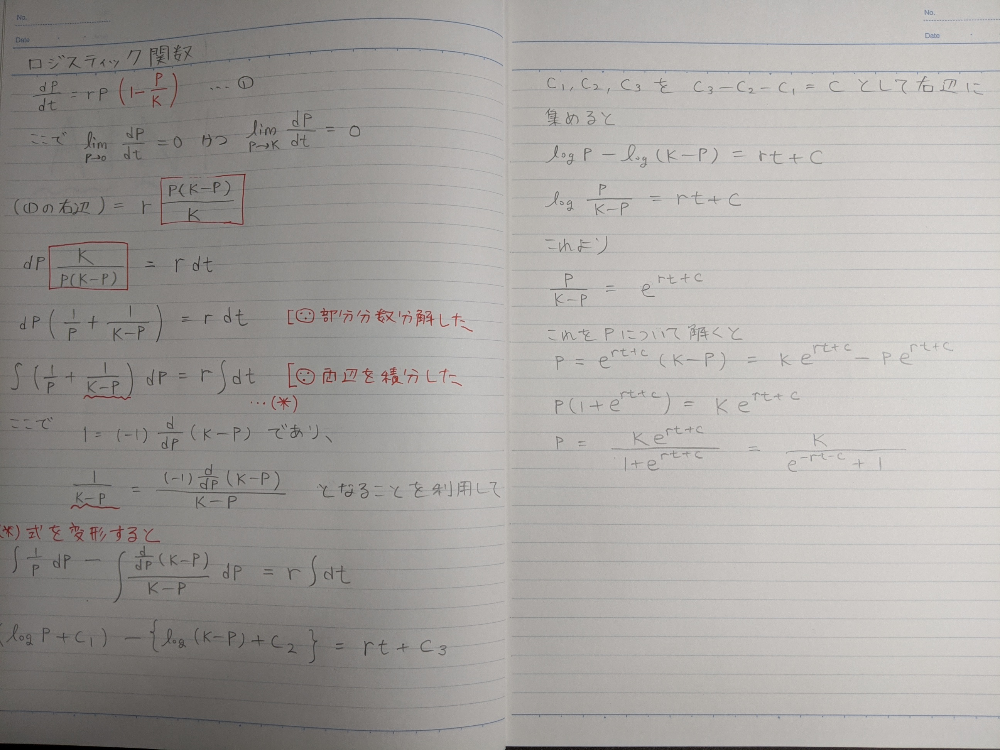

In [5]:
im = Image.open("answer/a19-logistic.jpg")
im

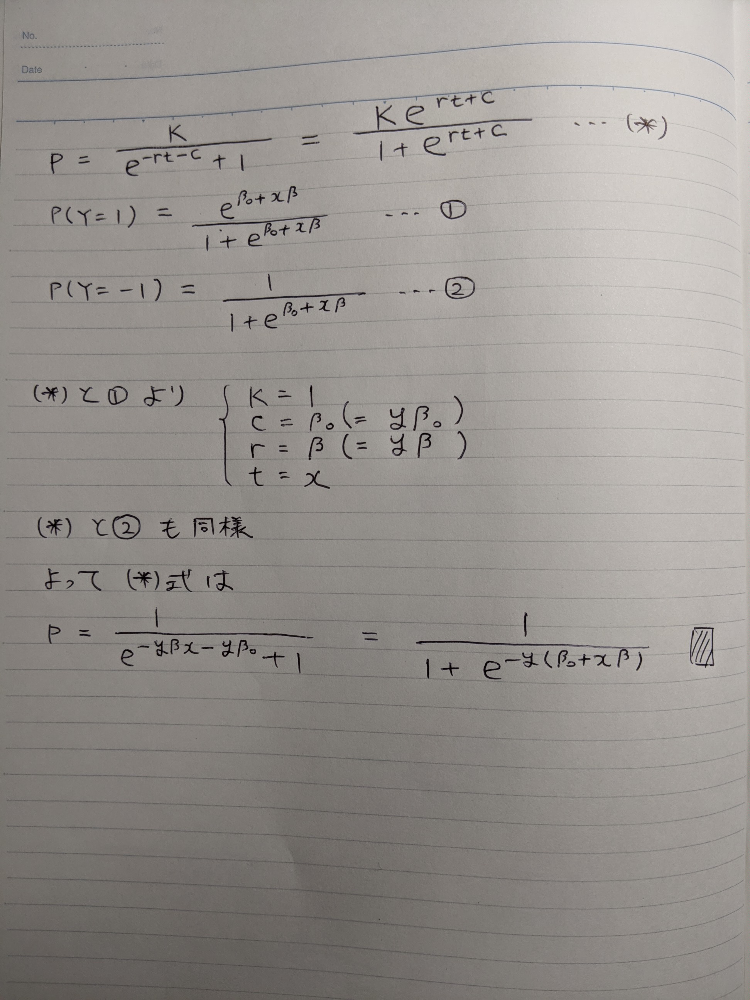

In [6]:
im = Image.open("answer/a19.jpg")
im

# 20

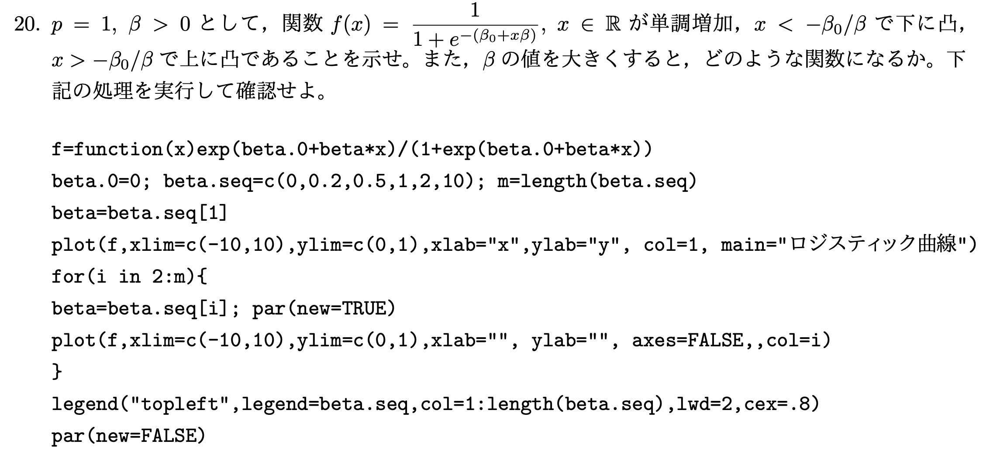

In [7]:
im = Image.open("question/q20.png")
im

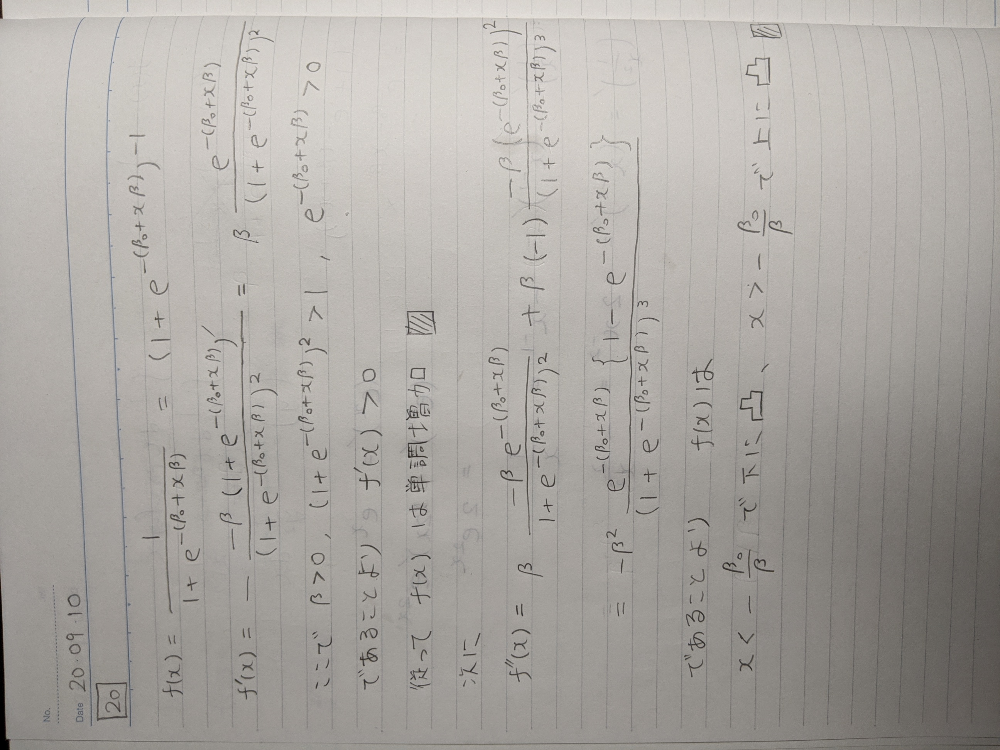

In [8]:
# 問題の前半部分：
im = Image.open("answer/a20.jpg")
im

In [9]:
# 問題の後半部分：
def f(x):
    return np.exp(beta_0+beta*x)/(1+np.exp(beta_0+beta*x))

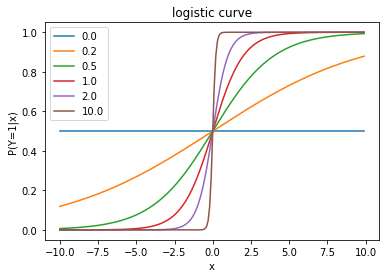

In [10]:
beta_0=0
beta_seq=np.array([0,0.2,0.5,1,2,10])
x_seq=np.arange(-10,10,0.1)

plt.xlabel("x")
plt.ylabel("P(Y=1|x)")
plt.title("logistic curve")
for i in range(beta_seq.shape[0]):
    beta=beta_seq[i]
    p=f(x_seq)
    plt.plot(x_seq,p,label='{}'.format(beta))
plt.legend(loc='upper left')

# 22

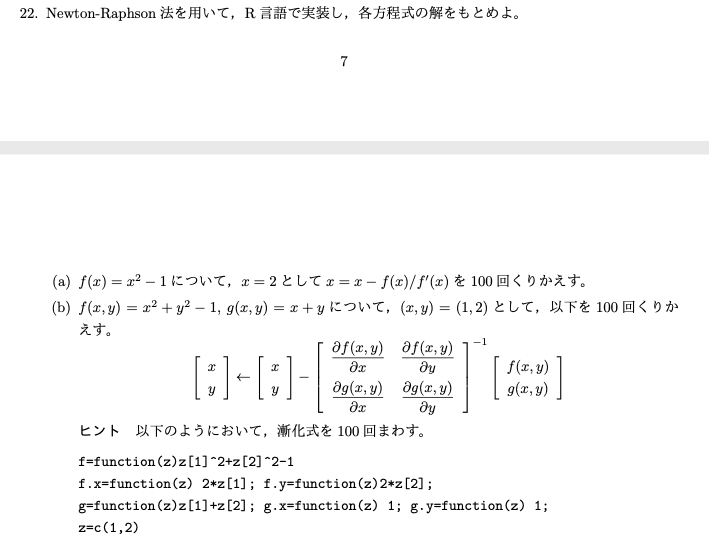

In [11]:
im = Image.open("question/q22.png")
im

In [12]:
# (a)

def f(x):
    return x**2 - 1

def df(x):
    return 2 * x

In [13]:
x = 2  # 初期値
for i in range(100):
    x = x - f(x)/df(x)
x

1.0

In [14]:
x = -2  # 初期値
for i in range(100):
    x = x - f(x)/df(x)
x

-1.0

初期値によって結果が変化する

In [15]:
#(b)

def f(z):
    return z[0]**2 + z[1]**2 - 1

def dfx(z):
    return 2 * z[0]

def dfy(z):
    return 2 * z[1]

def g(z):
    return z[0] + z[1]

def dgx(z):
    return 1

def dgy(z):
    return 1

In [16]:
# 初期値
z = np.array([1,2])

for i in range(100):
    jacob = np.array([[dfx(z), dfy(z)], [dgx(z), dgy(z)]])
    z = z - np.linalg.inv(jacob) @ np.array([f(z), g(z)])
z

array([-0.70710678,  0.70710678])

In [17]:
f(z)

2.220446049250313e-16

In [18]:
g(z)

0.0

f(x,y)とg(x,y)のどちらも0と見なしてよい。

# 24

In [19]:
N=1000; p=2
X=randn(N,p) 
X

array([[-1.57781877, -1.19349907],
       [-0.67393221,  0.60460906],
       [-0.51290105,  0.41460139],
       ...,
       [-1.1244994 ,  0.09638749],
       [-1.13408187,  0.04486351],
       [ 0.75018534,  0.09975257]])

In [20]:
X=np.insert(X, 0, 1, axis=1)
X

array([[ 1.        , -1.57781877, -1.19349907],
       [ 1.        , -0.67393221,  0.60460906],
       [ 1.        , -0.51290105,  0.41460139],
       ...,
       [ 1.        , -1.1244994 ,  0.09638749],
       [ 1.        , -1.13408187,  0.04486351],
       [ 1.        ,  0.75018534,  0.09975257]])

In [21]:
beta=randn(p+1)
beta

array([ 0.26768596, -0.09289834,  1.43536366])

In [22]:
y=[]
prob=1/(1+np.exp(X@beta))
prob

array([0.78564011, 0.23180858, 0.28691034, 0.4644441 , 0.77550091,
       0.69316559, 0.70850898, 0.54597653, 0.61220649, 0.35784302,
       0.91254258, 0.68864403, 0.27424293, 0.19202236, 0.08879356,
       0.77298077, 0.69829269, 0.36761236, 0.08646613, 0.13011951,
       0.09381068, 0.53907583, 0.42014953, 0.54052681, 0.18961949,
       0.54648982, 0.04445   , 0.21376171, 0.67024218, 0.79257363,
       0.14934977, 0.74202178, 0.25767678, 0.88689014, 0.52829613,
       0.72595569, 0.6873599 , 0.65848667, 0.81348621, 0.31044474,
       0.89968584, 0.64477295, 0.35835233, 0.21692845, 0.30378478,
       0.59015314, 0.49074928, 0.09649844, 0.04851909, 0.30756976,
       0.36194932, 0.16977167, 0.12779484, 0.62711466, 0.4043932 ,
       0.6403436 , 0.64473095, 0.64066391, 0.57656701, 0.3383043 ,
       0.48529418, 0.88625571, 0.25988881, 0.33940363, 0.82294735,
       0.49552336, 0.64831304, 0.90388294, 0.52122623, 0.29174377,
       0.92150345, 0.40671262, 0.42363897, 0.12093466, 0.26616

In [23]:
len(prob)

1000

In [24]:
for i in range(N):
    if (np.random.rand(1)>prob[i]):
        y.append(1)
    else :
        y.append(-1)
#データの生成ここまで

In [25]:
#最尤推定
beta=np.inf
gamma=randn(p+1) #betaの初期値
print(gamma)
while (np.sum((beta-gamma)**2)>0.001):
    beta=gamma
    s = X@beta
    v = np.exp(-s*y)
    u = (y*v)/(1+v)  # (N,)
    w = v/(1+v)**2  # (N,)
    W = np.diag(w)  # (N,N)
    z = s+u/w
    
    gamma=np.linalg.inv(X.T@W@X)@X.T@W@z
    print (gamma)

[0.51140486 0.26216324 0.58034424]
[ 0.1596562  -0.00768663  1.19606625]
[ 0.14366169 -0.02917453  1.4155722 ]
[ 0.14330642 -0.03162882  1.44043588]


gammaはほぼbetaと同じ値に収束していることが確認できた